# 4. Bin weight anomaly detection

## 4.1 Data Cleaning

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from tqdm import tqdm
from copy import deepcopy
import peakutils

In [2]:
v5 = pd.read_csv("Spare-it V5 scale records Jan 1 to Nov 20 2023.csv")
cds = pd.read_excel("Fullness Assessments up to Nov 20th.xlsx")

In [3]:
# Filter CDS bins
v5 = v5[v5['bin'].isin(cds.bin.unique())]

# Drop duplicates
v5.drop_duplicates(inplace=True) 

# Change the type of ‘createdat’ to datetime and create a new column of ‘createdat_ns’
v5['createdat_ns'] = pd.to_datetime(v5["createdat"])

# Drop the rows where the ‘hide’ value is True
v5.drop(v5[v5.hide].index, axis=0, inplace=True)

# Drop unnecessary columns
v5.drop(['createdat','updatedat','year','month','day','errorcode',"hide","weightdiff","battery"], axis=1, inplace=True)

# Group by "bin" and sort by "createdat_ns"
v5 = v5.groupby(by='bin').apply(lambda x: x.sort_values(["createdat_ns"],ascending= True))

# Reset index
v5.reset_index(drop=True,inplace=True)

# Caculate time interval
v5['interval'] = np.nan
same_bin = v5.bin == v5.bin.shift(1)
v5.interval = v5.createdat_ns[same_bin] - v5.createdat_ns.shift(1)[same_bin]

# Merge key information from 'v5' and 'cds' based on 'bin'
cds = cds[['bin', 'floor']]
key_info = pd.merge(v5, cds, on=['bin'], how='inner')
key_info.drop_duplicates(inplace=True) 

# Reset index
key_info.reset_index(drop=True,inplace=True)

key_info.head()

,iotid,bin,weight,createdat_ns,interval,floor
0,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1713.588159,2023-01-18 16:16:00,NaT,13
1,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1719.691768,2023-01-18 16:18:00,0 days 00:02:00,13
2,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1713.588159,2023-01-18 16:19:00,0 days 00:01:00,13
3,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1713.588159,2023-01-18 16:20:00,0 days 00:01:00,13
4,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1710.536355,2023-01-18 16:21:00,0 days 00:01:00,13


## 4.2 PCA Method

In [4]:
# Set the start and end dates
start_date = '2023-2-01 00:00:00'
end_date = '2023-11-20 00:00:00'

# Generate a date range every two weeks, including up to seconds
date_ranges = pd.date_range(start=start_date, end=end_date, freq='2W', normalize=False)

# Create a list for two-week groups
intervals = [(date_ranges[i], date_ranges[i + 1] - pd.Timedelta(seconds=1)) for i in range(len(date_ranges) - 1)]
intervals = [(start.strftime("%Y-%m-%d %H:%M:%S"), end.strftime("%Y-%m-%d %H:%M:%S")) for start, end in intervals]

intervals

[('2023-02-05 00:00:00', '2023-02-18 23:59:59'),
 ('2023-02-19 00:00:00', '2023-03-04 23:59:59'),
 ('2023-03-05 00:00:00', '2023-03-18 23:59:59'),
 ('2023-03-19 00:00:00', '2023-04-01 23:59:59'),
 ('2023-04-02 00:00:00', '2023-04-15 23:59:59'),
 ('2023-04-16 00:00:00', '2023-04-29 23:59:59'),
 ('2023-04-30 00:00:00', '2023-05-13 23:59:59'),
 ('2023-05-14 00:00:00', '2023-05-27 23:59:59'),
 ('2023-05-28 00:00:00', '2023-06-10 23:59:59'),
 ('2023-06-11 00:00:00', '2023-06-24 23:59:59'),
 ('2023-06-25 00:00:00', '2023-07-08 23:59:59'),
 ('2023-07-09 00:00:00', '2023-07-22 23:59:59'),
 ('2023-07-23 00:00:00', '2023-08-05 23:59:59'),
 ('2023-08-06 00:00:00', '2023-08-19 23:59:59'),
 ('2023-08-20 00:00:00', '2023-09-02 23:59:59'),
 ('2023-09-03 00:00:00', '2023-09-16 23:59:59'),
 ('2023-09-17 00:00:00', '2023-09-30 23:59:59'),
 ('2023-10-01 00:00:00', '2023-10-14 23:59:59'),
 ('2023-10-15 00:00:00', '2023-10-28 23:59:59'),
 ('2023-10-29 00:00:00', '2023-11-11 23:59:59')]

In [5]:
v5_2 = deepcopy(key_info)
v5_2 = v5_2.loc[(v5_2.createdat_ns>= intervals[0][0]) & (v5_2.createdat_ns<= intervals[-1][1])]
v5_2.head()

,iotid,bin,weight,createdat_ns,interval,floor
992,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1670.862898,2023-02-05 00:09:00,0 days 00:30:00,13
993,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1701.380941,2023-02-05 00:39:00,0 days 00:30:00,13
994,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1722.743572,2023-02-05 01:09:00,0 days 00:30:00,13
995,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1738.002594,2023-02-05 01:40:00,0 days 00:31:00,13
996,lora-000350,007099f0-9c71-45d7-a3d0-2f44f83f7f40,1750.209812,2023-02-05 02:10:00,0 days 00:30:00,13


In [6]:
from joblib import Parallel, delayed
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
import peakutils

# Function to fit ARIMA model and detect anomalies
def fit_arima_and_detect_anomalies(df, bin_id):
    try:
        subset = df[df['bin'] == bin_id]
        order = auto_arima(subset['weight']).order
        model = ARIMA(subset['weight'], order=order)
        fit_model = model.fit()

        # Calculate predictions and residuals
        subset['predicted_weight'] = fit_model.predict(start=subset.index.min(), end=subset.index.max(), dynamic=False)
        subset['residuals'] = subset['weight'] - subset['predicted_weight']
        residual_mean = np.mean(subset['residuals'])

        # Set thresholds for anomaly detection
        upper_threshold = residual_mean + 2.0 * subset['residuals'].std()
        lower_threshold = residual_mean - 2.0 * subset['residuals'].std()

        subset['anomaly_flag'] = ((subset['residuals'] > upper_threshold) | (subset['residuals'] < lower_threshold)).astype(int)

        return subset[['bin', 'anomaly_flag']]
    except Exception as e:
        print(f"Error processing bin {bin_id}: {e}")
        return pd.DataFrame(columns=['bin', 'anomaly_flag'])

# Function to calculate baseline and difference
def calculate_baseline_and_diff(df):
    # Initialize rolling baseline column
    df['baseline_rolling'] = np.nan

    for bin_id in df['bin'].unique():
        bin_data = df[df['bin'] == bin_id]
        baseline_values = peakutils.baseline(bin_data['weight'].values, deg=3)

        temp_df = pd.DataFrame({'createdat_ns': bin_data['createdat_ns'], 'baseline_peakutils': baseline_values})
        temp_df.set_index('createdat_ns', inplace=True)

        temp_df['baseline_rolling'] = temp_df['baseline_peakutils'].rolling('15D').mean()
        df.loc[df['bin'] == bin_id, 'baseline_rolling'] = temp_df['baseline_rolling'].values

    df['diff'] = df['weight'] - df['baseline_rolling']
    df[['baseline_rolling', 'diff']] = df[['baseline_rolling', 'diff']].fillna(method='ffill').astype(float)

    return df

v5_interval = []

for i, interval in enumerate(intervals): 
    v5_3 = deepcopy(v5_2)
    v5_3 = v5_3.loc[(v5_3.createdat_ns>= interval[0]) & (v5_3.createdat_ns<= interval[1])]
    v5_3.reset_index(drop=True,inplace=True)

    # Remove anomalies
    v5_3['anomaly_flag'] = np.nan
    results = Parallel(n_jobs=-1)(delayed(fit_arima_and_detect_anomalies)(v5_3, bin_id) for bin_id in v5_3['bin'].unique())
    
    for result in results:
        if not result.empty:
            v5_3.loc[v5_3['bin'] == result['bin'].values[0], 'anomaly_flag'] = result['anomaly_flag'].values
    v5_3 = v5_3[v5_3['anomaly_flag'] == 0.0]

    # Baseline correction
    v5_3 = calculate_baseline_and_diff(v5_3)
    
    # Normalize the data
    v5_3['diff_normalized'] = v5_3.groupby('bin')['diff'].transform(lambda x: (x - x.mean()) / x.std())

    # Group and sort by floor
    v5_3 = v5_3.groupby('floor')
    v5_3 = [group for _, group in sorted(v5_3, key=lambda x: x[0], reverse=True)]
    v5_3 = pd.concat(v5_3)
    v5_3.reset_index(drop=True,inplace=True)
    
    v5_interval.append(v5_3)

In [7]:
v5_interval[0].head()

,iotid,bin,weight,createdat_ns,interval,floor,anomaly_flag,baseline_rolling,diff,diff_normalized
0,lora-000398,0f322359-da75-44d2-873a-c7424234fa3f,2046.234836,2023-02-05 00:28:00,0 days 00:30:00,17,0.0,1895.008759,151.226078,-0.536189
1,lora-000398,0f322359-da75-44d2-873a-c7424234fa3f,2043.183032,2023-02-05 00:58:00,0 days 00:30:00,17,0.0,1893.786239,149.396793,-0.537894
2,lora-000398,0f322359-da75-44d2-873a-c7424234fa3f,2049.286641,2023-02-05 01:28:00,0 days 00:30:00,17,0.0,1892.570110,156.716531,-0.531069
3,lora-000398,0f322359-da75-44d2-873a-c7424234fa3f,2049.286641,2023-02-05 01:58:00,0 days 00:30:00,17,0.0,1891.360356,157.926285,-0.529941
4,lora-000398,0f322359-da75-44d2-873a-c7424234fa3f,2049.286641,2023-02-05 02:28:00,0 days 00:30:00,17,0.0,1890.156962,159.129679,-0.528819


To avoid errors caused by filling NaN, we dropped the bins that have few records and recorded filtering information.

In [8]:
def filter_bins_with_few_records(df, threshold=600):
    original_count = len(df)
    unique_bins_before = len(df.bin.unique())

    # Count the number of records for each bin
    bin_count = df['bin'].value_counts()

    # Identify bins with fewer records than the threshold
    bins_to_drop = bin_count[bin_count < threshold].index
    df = df[~df['bin'].isin(bins_to_drop)]

    # Compile summary statistics
    stats = pd.DataFrame({
        "Description": ["Number of original records", "Number of original bins", "Number of filtered records", "Number of filtered bins"],
        "Count": [original_count, unique_bins_before, len(df), len(df.bin.unique())]
    })

    return df, stats

filtered_v5_intervals = []
filtered_v5_info = []
for df in v5_interval:
    filtered_df, stats = filter_bins_with_few_records(df)
    filtered_v5_intervals.append(filtered_df)
    filtered_v5_info.append(stats)


In [9]:
filtered_v5_info[0]

,Description,Count
0,Number of original records,144805
1,Number of original bins,228
2,Number of filtered records,137791
3,Number of filtered bins,216


Create a DataFrame where each index represents the bin IDs, and each column corresponds to a specific timestamp. In this DataFrame, the values are the normalized differences in weight (diff_normalized) for each bin at various timestamps. If no record is available for a particular bin at a given timestamp, the corresponding cell in the DataFrame will be filled with NaN.

In [10]:
pca_data_df = []
for df in filtered_v5_intervals:
    # Preserve Original Bin Order
    original_column_order = df['bin'].unique()
    
    # Pivot DataFrame
    df = df.pivot(index='bin', columns='createdat_ns', values='diff_normalized')

    # Reindex DataFrame
    df = df.reindex(index=original_column_order)

    # Fill the NaN values
    df_fill = df.interpolate(method='linear',axis=1)

    # drop the NaN values
    df_fill = df_fill.dropna(axis=1)

    pca_data_df.append(df_fill)

In [11]:
pca_data_df[4].head()

createdat_ns,2023-04-02 02:25:00,2023-04-02 02:26:00,2023-04-02 02:27:00,2023-04-02 02:28:00,2023-04-02 02:29:00,2023-04-02 02:30:00,2023-04-02 02:31:00,2023-04-02 02:32:00,2023-04-02 02:33:00,2023-04-02 02:34:00,...,2023-04-15 23:50:00,2023-04-15 23:51:00,2023-04-15 23:52:00,2023-04-15 23:53:00,2023-04-15 23:54:00,2023-04-15 23:55:00,2023-04-15 23:56:00,2023-04-15 23:57:00,2023-04-15 23:58:00,2023-04-15 23:59:00
bin,,,,,,,,,,,,,,,,,,,,,
0f322359-da75-44d2-873a-c7424234fa3f,-0.572172,-0.572701,-0.573229,-0.573758,-0.574286,-0.574814,-0.575343,-0.575871,-0.576400,-0.576928,...,-0.583952,-0.583952,-0.583952,-0.583952,-0.583952,-0.583952,-0.583952,-0.583952,-0.583952,-0.583952
186102ac-e7d8-42a2-82c6-17a201063594,-0.389782,-0.390038,-0.390293,-0.390548,-0.390804,-0.391059,-0.391315,-0.391570,-0.391826,-0.392081,...,-0.328068,-0.328068,-0.328068,-0.328068,-0.328068,-0.328068,-0.328068,-0.328068,-0.328068,-0.328068
3cc764cc-8e5e-4140-be35-715c26e758de,-0.532637,-0.532951,-0.533265,-0.533579,-0.533893,-0.534207,-0.534521,-0.534835,-0.535148,-0.535462,...,-0.581548,-0.581548,-0.581548,-0.581548,-0.581548,-0.581548,-0.581548,-0.581548,-0.581548,-0.581548
3cf2bad6-8022-4b5e-b8a0-aa6730a8f2e5,-0.448361,-0.449004,-0.449647,-0.450290,-0.450933,-0.451576,-0.452219,-0.452862,-0.453505,-0.454148,...,-0.360230,-0.360230,-0.360230,-0.360230,-0.360230,-0.360230,-0.360230,-0.360230,-0.360230,-0.360230
4f56d445-de55-4578-86bc-9a61bceb2c7a,-0.223156,-0.223365,-0.223574,-0.223783,-0.223991,-0.224200,-0.224409,-0.224618,-0.224827,-0.225036,...,-0.786552,-0.786552,-0.786552,-0.786552,-0.786552,-0.786552,-0.786552,-0.786552,-0.786552,-0.786552


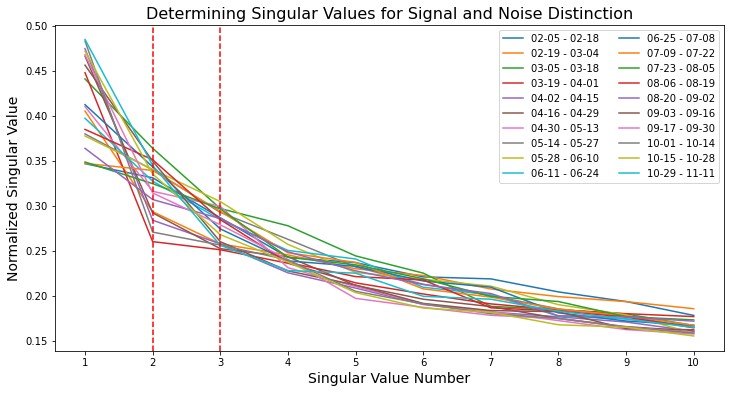

In [49]:
from datetime import datetime
# Create a single figure
plt.figure(figsize=(12, 6))

# Function to format intervals
def format_interval(interval):
    start_date, end_date = interval
    start_date = datetime.strptime(start_date, '%Y-%m-%d %H:%M:%S')
    end_date = datetime.strptime(end_date, '%Y-%m-%d %H:%M:%S')
    return start_date.strftime('%m-%d') + ' - ' + end_date.strftime('%m-%d')

for i, df in enumerate(pca_data_df):
    # Convert dataframe to numpy array
    df_values = df.values

    # Calculate norm of each bin
    norm = np.linalg.norm(df_values, axis=1, ord=1)

    # Perform SVD
    u, s, vt = np.linalg.svd(df_values, full_matrices=False)

    # Plot the normalized singular values
    plt.plot(range(1, 11), s[:10] / np.linalg.norm(df_values), label=format_interval(intervals[i]))

    #plt.scatter(2, s[1] / np.linalg.norm(df_values), color='red')

plt.axvline(x=2, color='red',linestyle='--')
plt.axvline(x=3, color='red',linestyle='--')
plt.title("Determining Singular Values for Signal and Noise Distinction", size=16)
plt.xlabel("Singular Value Number", size=14)
plt.ylabel("Normalized Singular Value", size=14)

plt.xticks(range(1, 11))
plt.legend(loc='upper right', ncol=2)
plt.show()

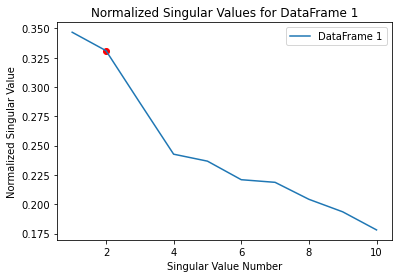

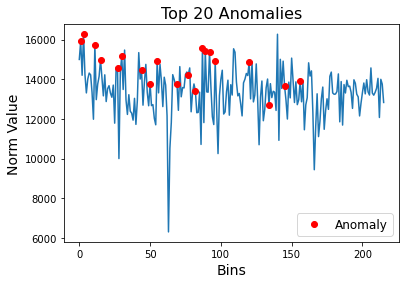

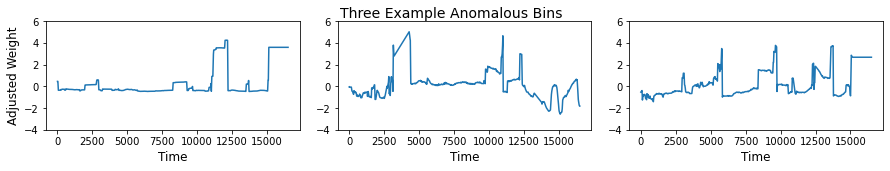

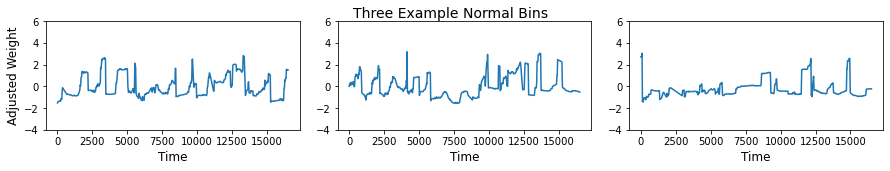

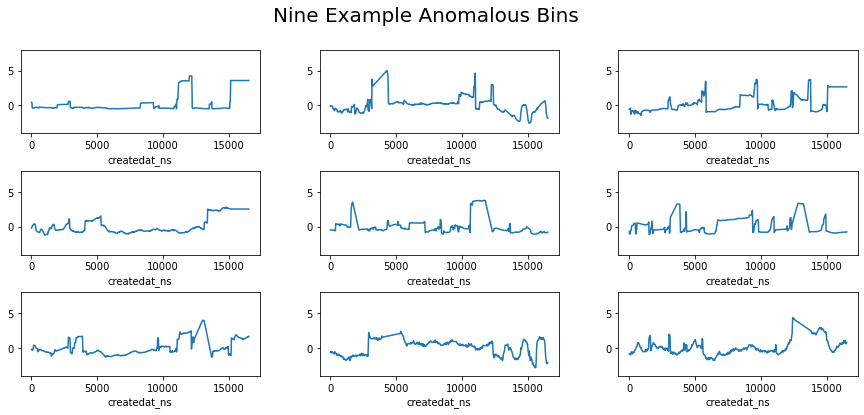

...

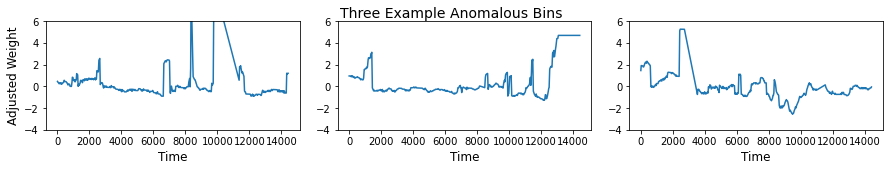

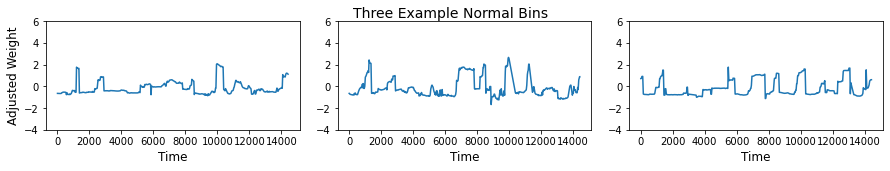

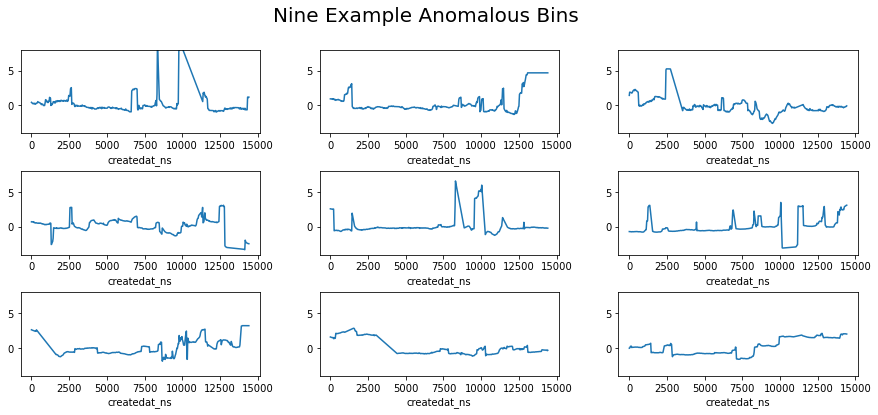

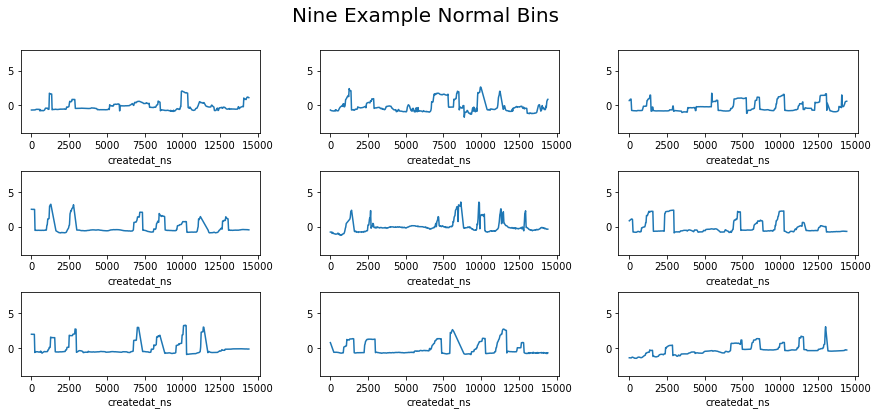

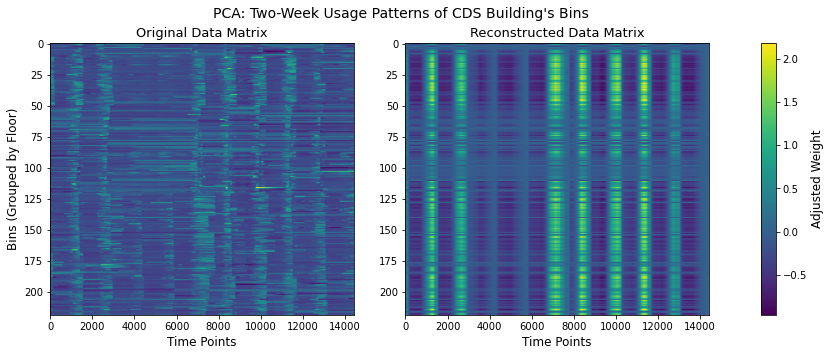

In [103]:
import matplotlib.gridspec as gridspec

for i, df in enumerate(pca_data_df):
    # Convert dataframe to numpy array
    df_values = df.values

    # Calculate norm of each bin
    norm = np.linalg.norm(df_values, axis=1, ord=1)

    # Perform SVD
    u, s, vt = np.linalg.svd(df_values, full_matrices=False)

    # Plot the normalized singular values
    plt.figure(i+1) 
    plt.plot(range(1, 11), s[:10] / np.linalg.norm(df_values), label=f'DataFrame {i+1}')
    plt.scatter(2, s[1] / np.linalg.norm(df_values), color='red')
    plt.title(f"Normalized Singular Values for DataFrame {i+1}")
    plt.xlabel("Singular Value Number")
    plt.ylabel("Normalized Singular Value")
    plt.legend()
    plt.show()

    # choose the top 2 columns of U for the normal space
    unorm = u[:,0:1]
    P = unorm.dot(unorm.T)
    N = P.dot(df_values)
    O = df_values - N
    Onorm = np.linalg.norm(O,axis=1)
    Onorm_sort = np.argsort(Onorm)[::-1]

    # get top 20 anomalies
    anomSet = Onorm_sort[:20]
    plt.plot(norm)
    plt.plot(anomSet,norm[anomSet],'ro', label='Anomaly')
    plt.legend(loc='lower right', fontsize=12)
    plt.xlabel("Bins", size=14)
    plt.ylabel("Norm Value", size=14)
    plt.title('Top 20 Anomalies',size = 16)

    plt.figure(figsize=(15,2))
    for i in range(1,4):
        ax = plt.subplot(1,3,i)
        plt.plot(df_values[Onorm_sort[i-1],:])
        plt.xlabel('Time', size=12)
        ax.set_ylim([-4,6])
    plt.subplot(1, 3, 1).set_ylabel('Adjusted Weight', size=12)
    plt.subplots_adjust(wspace=0.15)
    plt.suptitle('Three Example Anomalous Bins',size=14)

    plt.figure(figsize=(15,2))
    for i in range(1,4):
        ax = plt.subplot(1,3,i)
        plt.plot(df_values[Onorm_sort[::-1][i-1],:])
        plt.xlabel('Time', size=12)
        ax.set_ylim([-4,6])
    plt.subplot(1, 3, 1).set_ylabel('Adjusted Weight', size=12)
    plt.subplots_adjust(wspace=0.15)
    plt.suptitle('Three Example Normal Bins',size=14)
    #
    plt.figure(figsize=(15,6))
    for i in range(1,10):
        ax = plt.subplot(3,3,i)
        plt.plot(df_values[Onorm_sort[i-1],:])
        plt.xlabel('createdat_ns')
        ax.set_ylim([-4, 8])
    plt.subplots_adjust(wspace=0.25,hspace=0.45)
    plt.suptitle('Nine Example Anomalous Bins',size=20)

    plt.figure(figsize=(15,6))
    for i in range(1,10):
        ax = plt.subplot(3,3,i)
        plt.plot(df_values[Onorm_sort[::-1][i-1],:])
        plt.xlabel('createdat_ns')
        ax.set_ylim([-4, 8])
    plt.subplots_adjust(wspace=0.25,hspace=0.45)
    plt.suptitle('Nine Example Normal Bins',size=20)
#
    plt.figure(figsize=(13, 5))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05]) 

    ax0 = plt.subplot(gs[0])
    im0 = ax0.imshow(df_values, aspect='auto')
    ax0.set_title('Original Data Matrix', size=13)
    ax0.set_xlabel('Time Points', size=12)
    ax0.set_ylabel('Bins (Grouped by Floor)', size=12)

    ax1 = plt.subplot(gs[1])
    im1 = ax1.imshow(N, aspect='auto')
    ax1.set_title('Reconstructed Data Matrix', size=13)
    ax1.set_xlabel('Time Points', size=12)

    ax2 = plt.subplot(gs[2])
    cbar = plt.colorbar(im1, cax=ax2)
    cbar.set_label('Adjusted Weight', size=12) 

    plt.subplots_adjust(wspace=0.25)
    plt.suptitle("PCA: Two-Week Usage Patterns of CDS Building's Bins", size=14)
    plt.show()
    